# 基于Adaboost-CNN的中国传统甲胄制式图像分类
## 任务介绍

图像分类作为机器学习的重要任务之一，涵盖了广泛的应用领域。在本次大作业中，我们将关注于中国古代传统甲胄制式的分类问题。在这个任务中，我对甲胄图像划分成了4个类别：扎甲，山纹甲，鱼鳞甲，布面甲。

由于针对我们中国古代传统甲胄的图像分类任务还似乎没有前人做过，所以并没有找到经他人整理的完整的数据集。所以在任务中，我自己通过互联网进行数据集收集整理，然后构建模型进行训练，并在测试集测试练结果

我首先构建了CNN模型对数据集进行训练，但结果的准确率并不是很高。之后，我引入集成学习的思想，使用AdaBoost-CNN在之前的CNN模型的基础上进行训练，最终得到测试集准确率达到84.375%.

另外，由于程序中使用到了Tensorflow中的keras等库，所以程序不可再paddlepaddle上运行。我的开发流程在jupyter notebook中完成。

## 描述数据集

### 数据集来源

由于我们中国古代传统甲胄的领域比较冷门，也没有人尝试过这方面的图像识别任务，所以并没有找到现成的，别人整理好的数据集。于是，我只能通过互联网等方式自己收集数据集。我的数据集中的大部分图片收集自“花瓣”等一些供美术设计工作者提供灵感参照的图片APP。其中有较大数量的图片可以供采集。我通过这些渠道将图片一一下载并存放至对应的文件夹中供程序读入。

最终的数据集中包含了4个类别的图像：札甲，山纹甲，鱼鳞甲，布面甲。当然，我本来还去尝试收集了一些其他的甲胄制式，如早期的皮甲，以及明朝的全铁甲等，但因为这些图片数量太少，最终还是没有囊括进来。我最终总共收集了631张图片，包含4种类别。在训练中，将数据集中10%的图片划分出来作为测试集

### 简述肉眼如何分辨传统甲胄的种类

札甲：札甲由一片片的甲片互相叠在一起构成。使用甲绳固定甲片之间的结构。穿戴札甲时，我们可以看到甲片上露出的甲绳，同时也可以很清晰地看见甲片互相重叠的结构。

山纹甲：山纹甲是中国特有的甲种。山纹甲没有甲绳，由一个个三棱形的甲片环环相扣组成。外观上可以看到三棱形的结构，也很易分辨。

鱼鳞甲：顾名思义，甲片呈鱼鳞状相互叠在一起。鱼鳞甲的甲绳隐藏在里面，被甲片覆盖。

布面甲：外层是布或棉，防御用的甲片由铆钉固定，隐藏在内侧。穿戴布面甲时，从外侧只可以看到布面以及固定使用的铆钉。

### 数据读入操作

不同类别的甲胄图片分别存在不同的文件夹中。将图片一次读取，归一化，统一分辨率，放入np数组中，然后进行打乱。

在训练前，我们将数据集划分，其中10%的数据作为测试集

下图是数据集文件夹的截图。

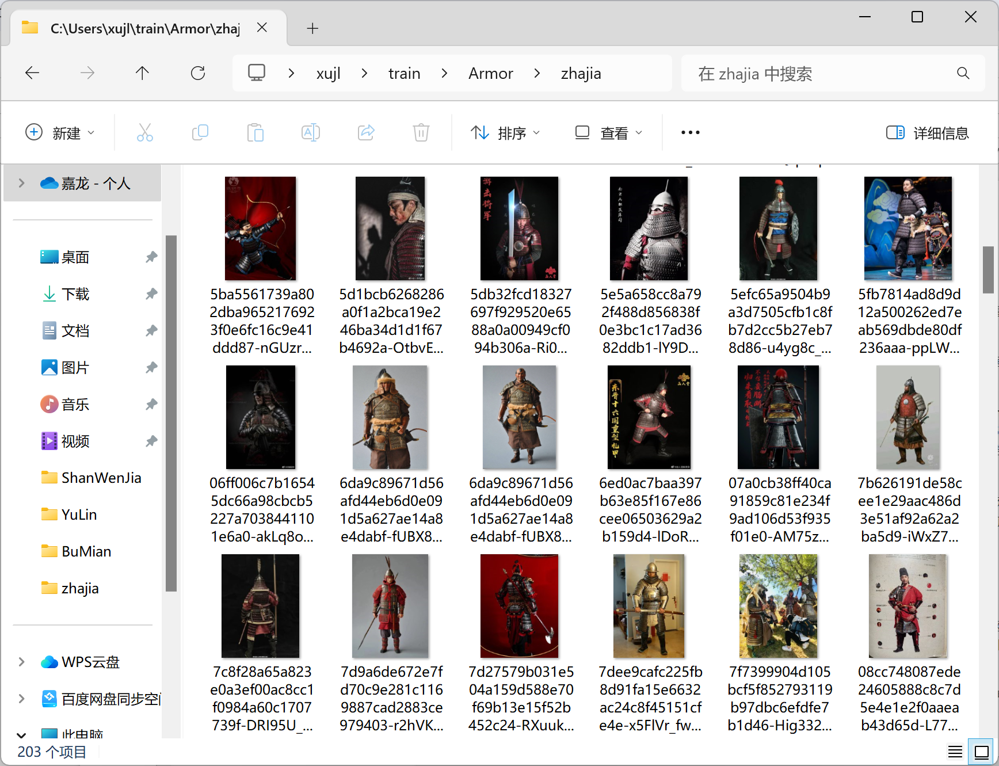


## 模型分析
### CNN

首先，针对图像分类问题，比较常用的方法就是使用CNN

在这里，使用到keras, sklearn, numpy, pandas opencv python等库

数据增强层是图像识别分类任务中经典的做法，可以扩充数据集，增强模型的泛化能力。
首先，设置数据增强层，将数据进行，随机反转（水平），随机旋转，随机缩放，随机平移。
但是在这里，我们并没有进行高斯噪波。这是因为对于甲胄的识别，可能需要通过甲片的排布，是否有甲绳等细节才能判定。如果添加高斯噪波，则可能会失去这些纹理，有时使得真人来看也难以判别。

下图是数据增强后结果示例
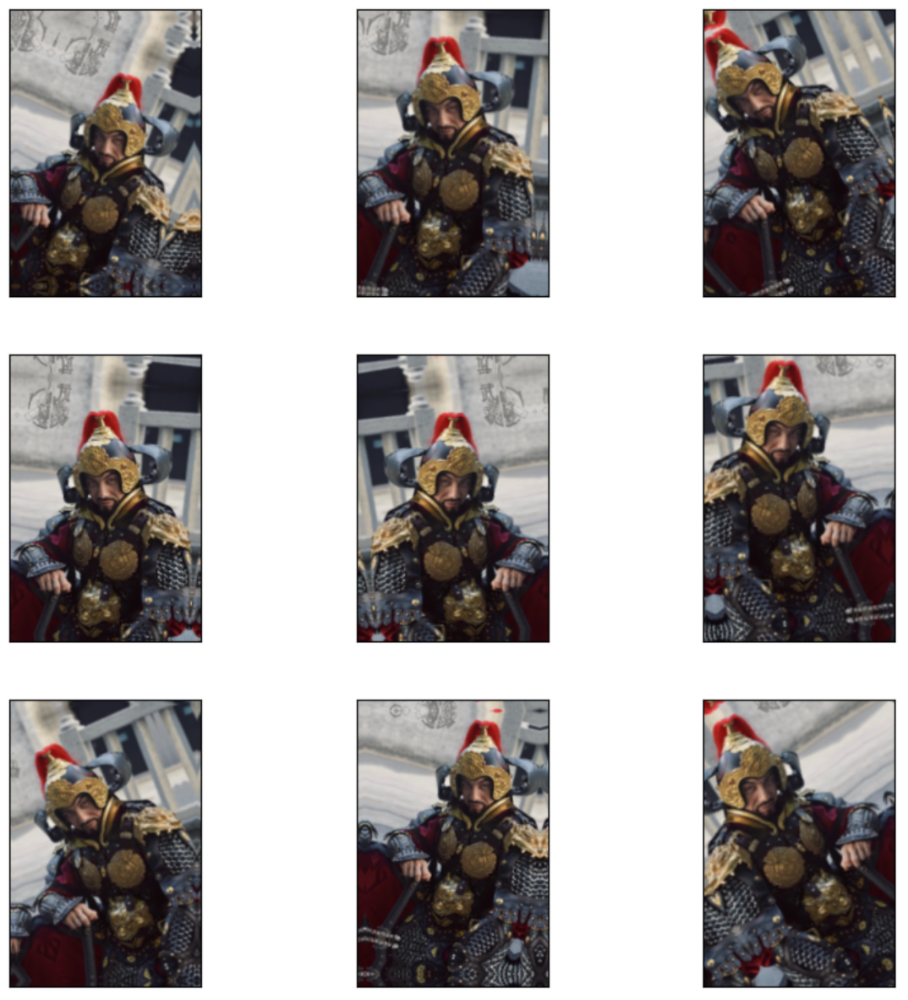

在我们的数据增强层之后，我们的神经网络按照如下设置
第一层：
   - 类型：2D卷积层 (Conv2D)
   - 卷积核数量：25
   - 卷积核大小：(3, 3)
   - 填充方式：'same'，即使用零填充，保持输入和输出的尺寸相同
   - 激活函数：ReLU（'relu'）
     
第二层：
   - 类型：2D卷积层 (Conv2D)
   - 卷积核数量：50
   - 卷积核大小：(3, 3)
   - 填充方式：'same'
   - 激活函数：ReLU
     
批归一化层：
   - 类型：批归一化层 (BatchNormalization)
     
最大池化层：
   - 类型：2D最大池化层 (MaxPooling2D)
   - 池化窗口大小：默认为(2, 2)
     
随机失活层：
   - 类型：随机失活层 (Dropout)
   - 失活率：0.2，即20%的神经元在训练时被随机失活
     
重复上述结构（两个卷积层、批归一化层、最大池化层、随机失活层的序列）两次。 第二次中的卷积层中的神经元数量分别为50，100。

Flatten层：
   - 类型：展平层 (Flatten)
   - 作用：将输入展平为一维数组，用于连接到全连接层
     
全连接层：
   - 类型：全连接层 (Dense)
   - 神经元数量：50
   - 激活函数：ReLU ('relu')
     
批归一化层：
   - 类型：批归一化层 (BatchNormalization)
     
随机失活层：
   - 类型：随机失活层 (Dropout)
   - 失活率：0.2，即20%的神经元在训练时被随机失活
     

输出层：
    - 类型：全连接层 (Dense)
    - 神经元数量：4，这里是一个四分类任务
    - 激活函数：Softmax ('softmax')

### Adaboost-CNN
可以看到，在我们只用CNN进行训练中，最终效果并不是很好。 

我想到可以尝试结合一些其他的方法来改进我们的模型。比如，是否可以把CNN看成一个弱分类器，每次训练一个epoch之后，根据它分类的结果，更新样本权重，让它更加注重其中分错的样本。这就让我想到Adaboost集成学习的方法。多个弱分类器通过AdaBoost技术组合在一起，形成一个强分类器。在这种技术中，一组弱分类器按顺序训练。每个分类器都是基于前一个分类器的错误进行训练的，并为每个训练样本分配一个权重。如果样本由前一个弱分类器正确训练，那么其权重将减小。若一个弱分类器没有被训练正确，那么后续的训练中将会给它分配更多的权重，使得训练过程中更加注重这些被分错的样本。

但是与我们学习的Adaboost与决策桩的使用不同，我们这里需要将Adaboost和CNN结合起来。很幸运，通过谷歌检索，我找到了一篇十分相关的论文：Aboozar Taherkhani, Georgina Cosma, T.M. McGinnity, AdaBoost-CNN: An adaptive boosting algorithm for convolutional neural networks to classify multi-class imbalanced datasets using transfer learning Neurocomputin , Volume 404, 2020, Pages 351-366, ISSN 0925-2312, https://doi.org/10.1016/j.neucom.2020.  这篇文章提出的Adaboost-CNN正好和我所想吻合。

这篇论文中指出AdaBoost算法在卷积神经网络上的应用有局限性，为了解决，需要在每一次迭代中，将之前CNN的训练参数复制到当前训练的模型中，而不是使用默认的参数随机初始化。

下面给出算法大致伪代码：

for i = 1 to M

    if 第一次迭代
    
        初始化每个数据样本的权重
        
        进行第一次训练
            else：
            将上一次迭代中训练的CNN的权重迁移到这次训练使用的CNN中
 
        进行本次迭代中CNN的训练，使用上一次更新的样本权重D进训练
            获得CNN的输出

    根据输出更新样本权重

    进行样本权重的标准化

根据以下公式，对样本权重进行更新别
[$$\[ D_{t+1}(i) = \frac{D_t(i) \cdot \exp(-\alpha \cdot \frac{K - 1}{K} \cdot) y_{i,k} \cdot \log(\hat{y}_{i,k})}{Z_t} \$$]i
这里的Yi并不是指数据标签的OneHot编码。对于我们的四分类问题，它是如下形式：

类别1：[1, -1/3, -1/3, -1/3]
类别2：[-1/3, 1, -1/3, -1/3]
类别3：[-1/3, -1/3, 1, -1/3]
类别4：[-1/3, -1/3, -1/3, 1]

可以看到，类别对应的位置是1，其余的位置，均填入-1/K-1。K在这里是类别数量。

同时，公式中的alpha并不是分类器权重，而是仅代表一个超参数学习率。

在我们迭代中计算出样本权重之后，需要让这个样本权重影响下一次CNN的训练，从而起到让其更加注重分错的样本的目的。这个的做法很简单，只需将样本权重与CNN中的交叉熵损失函数相乘。序列

# 损失函数分析
在传统CNN中，使用交叉熵损失函数

$$ J(\Theta) = - \frac{1}{m} \sum_{i=1}^{m} \sum_{k=1}^{K} y_{i,k} \cdot \log(\hat{y}_{i,k}) $$


但是在Adaboost-CNN中，为了使得更新的样本权重影响实际训练中的样本，需要在损失函数后面乘以对应的样本权重，如下所示：
$$ J(\Theta) = - \frac{1}{m} \sum_{i=1}^{m} \sum_{k=1}^{K} y_{i,k} \cdot \log(\hat{y}_{i,k}) \cdot D $$
​
 )

# 优化方法

使用了Adam优化器。Adam同时缝合了Momentum的对梯度累加的动量思想和RMSProp的梯度平方累加的动态学习率思想，可以很好解决梯度下降时遇到的一些震荡的问题。同时，引入修正项，使得在开始梯度下降的时候可以有一个较大的步长，解决冷启动的问题。

其中，应用梯度的一阶矩估计：

$$ m_t = \beta_1 \cdot m_{t-1} + (1 - \beta_1) \cdot g_t $$

这样，对过去的梯度进行累加，在遇到震荡的时候，震荡的方向因累加，符号相反，会相抵消得到较小的结果，而假如旁边有一个梯度相对较小，但不存在震荡的方向，则通过累加可使其获得一个更大的值，这样就可以快速从震荡中向该方向逃离

二阶矩估计：

$$ v_t = \beta_2 \cdot v_{t-1} + (1 - \beta_2) \cdot (g_t)^2 $$

Adam算法通过这种方法动态调节学习率，在遇到震荡的时候，减小学习率。
并为二者引入修正，
$$
\hat{m}_t = \frac{m_t}{1 - \beta_1^t}
$$

$$
\hat{v}_t = \frac{v_t}{1 - \beta_2^t}
$$


这样确保在梯度下降开始时使用较大的步长，解决冷启动的问题Adam的参数更新公式：
法
$$
\theta_{t+1} = \theta_t - \frac{\alpha \cdot \hat{m}_t}{\sqrt{\hat{v}_t} + \epsilon}
$$



# 结果分析

使用传统CNN，训练了100个epoch得到的测试集准确率为70.312%

使用Adaboost-CNN，在传统CNN的基础上进行训练，得到的测试集准确率为84.375%

下面是对于测试集中部分数据进行预测后结果进行可视化的结果

可以看到，大部分都分类正确，但当然，还是有一些分错的情况

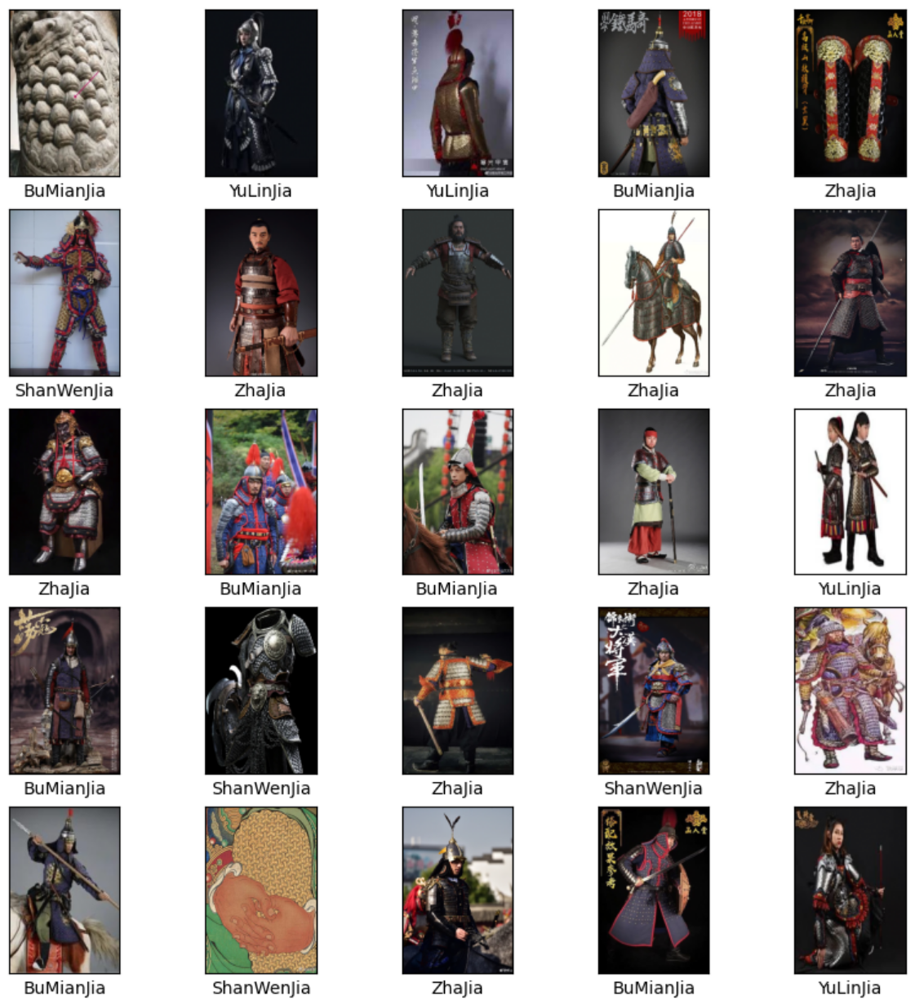

In [39]:
# TensorFlow
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Helper libraries
from pandas import read_csv
import numpy as np
import pandas as pd
import cv2
import random
import glob, os

print(tf.__version__)

2.13.0


203
343
486
631


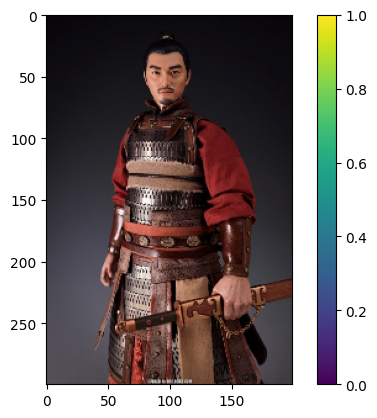

In [40]:

array_of_img = []  # this if for store all of the image data
image_sizex = 200
image_sizey = 300

directoryName = "./train/Armor/"
train_labels = np.empty((0,), dtype=int)    


zhajiaFolder = os.path.join(directoryName, "zhajia/")
shanwenjiaFolder = os.path.join(directoryName, "ShanWenJia/")
yulinjiaFolder = os.path.join(directoryName, "YuLin/")
bumianjiaFolder = os.path.join(directoryName, "BuMian/")

for filename in os.listdir(zhajiaFolder):    
    img_path = os.path.join(zhajiaFolder, filename)
    img = cv2.imread(img_path)
    img = img / 255.0
    img = cv2.resize(img, (image_sizex, image_sizey))
    array_of_img.append(img)
    train_labels = np.append(train_labels, 0)  
print(len(array_of_img))

for filename in os.listdir(shanwenjiaFolder):
    
    img_path = os.path.join(shanwenjiaFolder, filename)
    img = cv2.imread(img_path)
    img = img / 255.0
    img = cv2.resize(img, (image_sizex, image_sizey))
    array_of_img.append(img)
    train_labels = np.append(train_labels, 1)
print(len(array_of_img))

for filename in os.listdir(yulinjiaFolder):    
    if filename.endswith(".jpg"):
        img_path = os.path.join(yulinjiaFolder, filename)
        img = cv2.imread(img_path)
        img = img / 255.0
        img = cv2.resize(img, (image_sizex, image_sizey))
        array_of_img.append(img)
        train_labels = np.append(train_labels, 2)
print(len(array_of_img))

for filename in os.listdir(bumianjiaFolder):
    if filename.endswith(".jpg"):
        img_path = os.path.join(bumianjiaFolder, filename)
        img = cv2.imread(img_path)
        img = img / 255.0
        img = cv2.resize(img, (image_sizex, image_sizey))
        array_of_img.append(img)
        train_labels = np.append(train_labels, 3)
print(len(array_of_img))

train_images = np.array(array_of_img)

# 创建一个索引数组，用于打乱
num_samples = len(train_images)
shuffle_index = np.random.permutation(num_samples)

train_images = train_images[shuffle_index]
train_labels = train_labels[shuffle_index]

array_of_img = []

# train_images = train_images.reshape(train_images.shape[0], image_size, image_size, 1)
# train_images = train_images.astype('float32')
sample = random.randint(1, 595)
plt.figure()
plt.imshow(train_images[sample][:,:,::-1])
plt.colorbar()
plt.grid(False)
plt.show()

### 数据增强
创建一个数据增强层，增强模型泛化能力
2. 随机翻转（水平）
3. 随机变形
4. 随机旋转
5. 随机缩放

In [41]:
data_augmentation = keras.Sequential(
    [        
        keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
        keras.layers.experimental.preprocessing.RandomTranslation(0.1, 0.1),
        keras.layers.experimental.preprocessing.RandomRotation(0.1),
        keras.layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)

现在我们显示经过数据增强后的刚才那张图片:

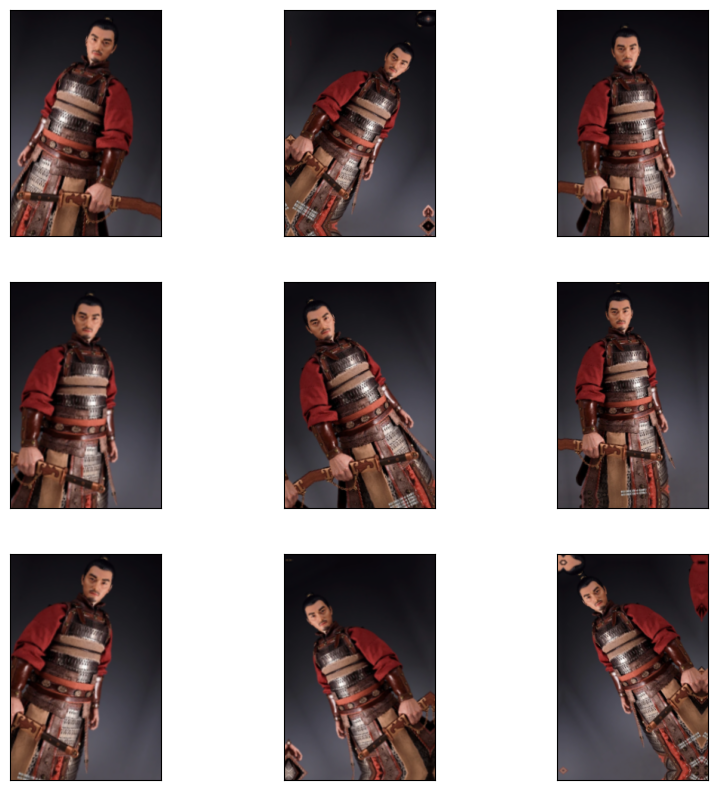

In [42]:
plt.figure(figsize=(10, 10))
for i in range(9):
    temp = train_images[sample:sample+1]
    augmented_images = data_augmentation(temp)
    ax = plt.subplot(3, 3, i + 1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(augmented_images[0][:,:,::-1])

In [43]:
class_names = ['ZhaJia', 'ShanWenJia','YuLinJia','BuMianJia']

In [44]:
train_images.shape

(631, 300, 200, 3)

In [45]:
len(train_labels)

631

将导入的数据集中的部分显示，并同时展示标签

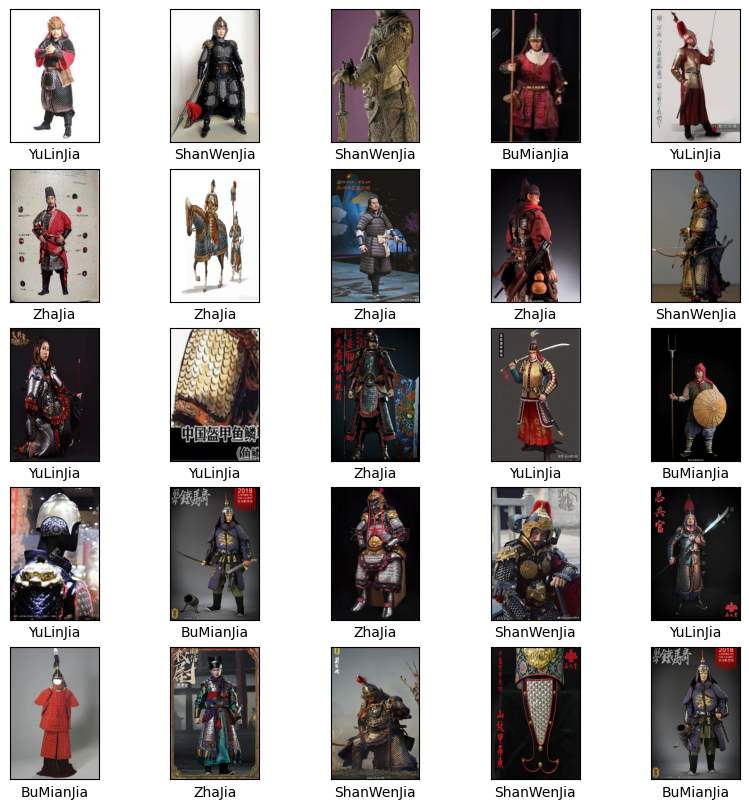

In [46]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    sample = random.randint(0, len(train_images)-1)
    plt.imshow(train_images[sample][:,:,::-1])
    plt.xlabel(class_names[train_labels[sample]])
plt.show()

### CNN的构建

In [9]:


model = keras.Sequential([
    data_augmentation,
    keras.layers.Conv2D(25, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(100, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Flatten(),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(4, activation='softmax')
])

In [10]:
model.build((None, image_sizex, image_sizey, 3))
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),              
              metrics=['accuracy']
              )
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 conv2d (Conv2D)             (None, 200, 300, 25)      700       
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 300, 50)      11300     
                                                                 
 batch_normalization (Batch  (None, 200, 300, 50)      200       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 100, 150, 50)      0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 100, 150, 50)     

### 训练前的准备工作

In [47]:
X_train, X_val, Y_train, Y_val = train_test_split(train_images, train_labels, test_size=0.1, random_state=3)
del train_images
del train_labels

save_weights = 'save_weights0.h5'
last_weights = 'last_weights0.h5'
best_weights = 'best_weights0.h5'
# model.load_weights(best_weights)

checkpoint = keras.callbacks.ModelCheckpoint(best_weights, monitor='val_accuracy', save_best_only=True, mode='max',
                                             verbose=1)
reduce = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=0, mode='auto',
                                           min_delta=0.0001, cooldown=0, min_lr=0)
earlyStopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, verbose=1, mode='auto')
callbacks = [checkpoint]

(64,)


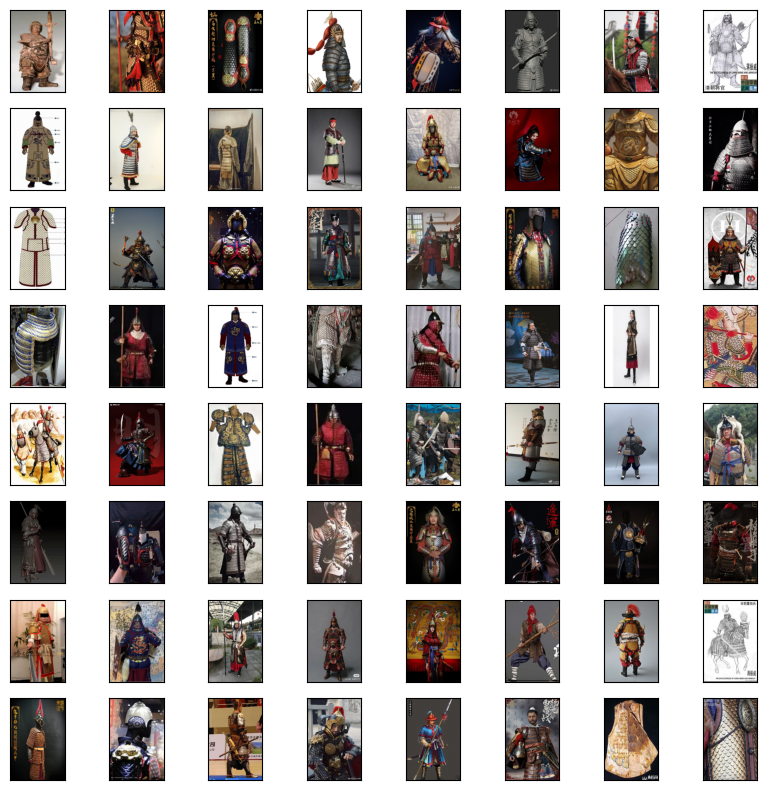

float64


In [48]:
print(Y_val.shape)

plt.figure(figsize=(10,10))
for i in range(64):
    plt.subplot(8,8,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    #sample = random.randint(0, 59)
    plt.imshow(X_val[i][:,:,::-1])
    #plt.xlabel(class_names[results[i]])
plt.show()

print(X_train.dtype)

### 模型的训练

训练过程中会保存最佳结果

Epoch 1/100
18/18 [==============================] - ETA: 0s - loss: 2.0264 - accuracy: 0.2751
Epoch 1: val_accuracy improved from -inf to 0.34375, saving model to best_weights0.h5


C:\Users\xujl\AppData\Roaming\Python\Python38\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


18/18 [==============================] - 76s 4s/step - loss: 2.0264 - accuracy: 0.2751 - val_loss: 1.5234 - val_accuracy: 0.3438
Epoch 2/100
18/18 [==============================] - ETA: 0s - loss: 1.5475 - accuracy: 0.2769
Epoch 2: val_accuracy did not improve from 0.34375
18/18 [==============================] - 72s 4s/step - loss: 1.5475 - accuracy: 0.2769 - val_loss: 2.5983 - val_accuracy: 0.1875
Epoch 3/100
18/18 [==============================] - ETA: 0s - loss: 1.5009 - accuracy: 0.3051
Epoch 3: val_accuracy did not improve from 0.34375
18/18 [==============================] - 72s 4s/step - loss: 1.5009 - accuracy: 0.3051 - val_loss: 2.6193 - val_accuracy: 0.2031
Epoch 4/100
18/18 [==============================] - ETA: 0s - loss: 1.5037 - accuracy: 0.3192
Epoch 4: val_accuracy did not improve from 0.34375
18/18 [==============================] - 72s 4s/step - loss: 1.5037 - accuracy: 0.3192 - val_loss: 2.4279 - val_accuracy: 0.1875
Epoch 5/100
18/18 [===========================

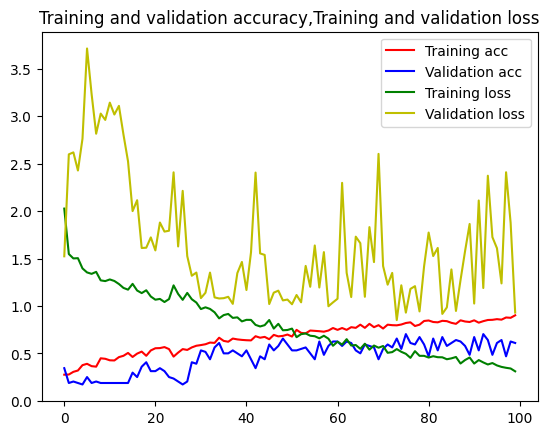

In [25]:
# hist = model.fit(train_images, train_labels, epochs=2000)
hist = model.fit(X_train, Y_train, epochs=100, validation_data=(X_val, Y_val), use_multiprocessing=True,
                 callbacks=callbacks, workers=3)

model.save('armorClassificationCNN.keras')
model.save_weights(last_weights)
plt.figure()

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training acc')  # 'bo'为画蓝色圆点，不连线
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.plot(epochs, loss, 'g', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation accuracy,Training and validation loss')
plt.legend()  # 绘制图例，默认在右上角

plt.show()

## 检验CNN训练结果

In [50]:
test_images = X_val
del array_of_img


In [51]:
test_images.shape

(64, 300, 200, 3)

In [52]:
predictions = model.predict(test_images)
results = np.argmax(predictions, axis=1)

2/2 [==============================] - 2s 784ms/step


In [53]:
np.set_printoptions(suppress=True)
predictions[0]

array([0.25130776, 0.2426797 , 0.25034994, 0.2556626 ], dtype=float32)

显示输出结果。这是一个四维的置信度向量，随后显示对应的预测类别

In [54]:
_Type = np.argmax(predictions[0])

In [55]:
class_names[_Type]

'BuMianJia'

最后，我们随机显示对25张图片的预测。

我们可以直观看到，样本中有很多预测错误的情况。

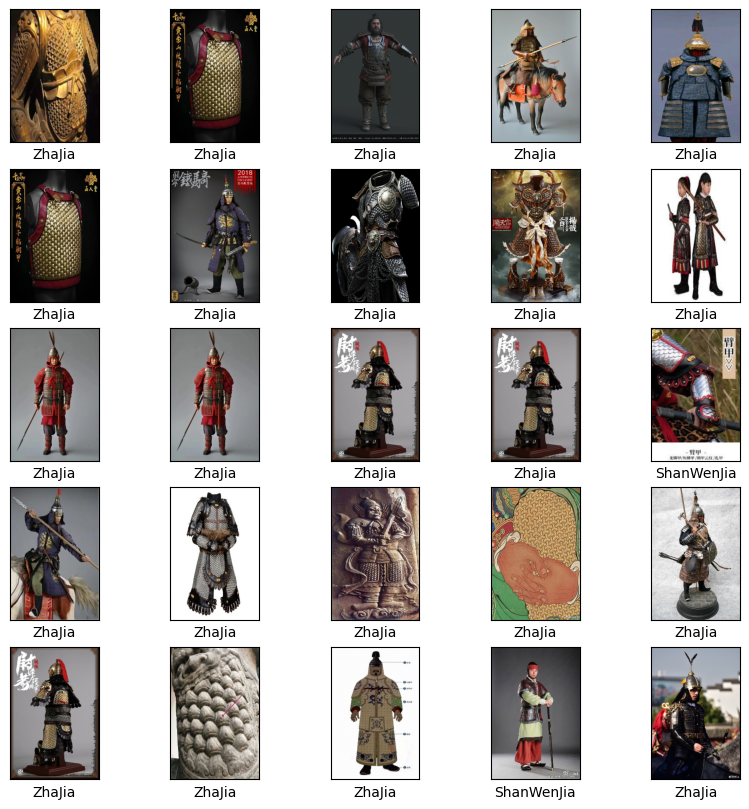

In [20]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    sample = random.randint(0, 59)
    plt.imshow(test_images[sample][:,:,::-1])
    plt.xlabel(class_names[results[sample]])
plt.show()

## AdaBoost-CNN

In [14]:
model1 = keras.Sequential([
    data_augmentation,
    keras.layers.Conv2D(25, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(100, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Flatten(),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(4, activation='softmax')
])

In [15]:


def buildModel():
    m = keras.Sequential([
    data_augmentation,
    keras.layers.Conv2D(25, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    keras.layers.Conv2D(50, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.Conv2D(100, kernel_size=(3, 3), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Flatten(),
    keras.layers.Dense(50, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(4, activation='softmax')
    ])

    m.build((None, image_sizex, image_sizey, 3))
    m.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              #loss = weighted_loss_fn,
              metrics=['accuracy']
              )
    return m

buildModel()

In [16]:
save_weights1 = 'save_weights1.h5'
last_weights1 = 'last_weights1.h5'
best_weights1 = 'best_weights1.h5'
# model.load_weights(best_weights)

checkpoint1 = keras.callbacks.ModelCheckpoint(best_weights1, monitor='val_accuracy', save_best_only=True, mode='max',
                                             verbose=1)
reduce1 = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=0, mode='auto',
                                           min_delta=0.0001, cooldown=0, min_lr=0)
earlyStopping1 = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, verbose=1, mode='auto')
callbacks1 = [checkpoint1]

然后，根据该篇论文中的描述，写出具体代码，并进行训练。
对CNN中的损失函数乘以权重，只需要调节sample_weight就可以实现预测中的贡献。

In [ ]:
from numpy.core.umath_tests import inner1d

# 定义样本权重 D
sample_weights = np.full(len(X_train), 1/len(X_train))
Y = []
for item in Y_train:
    t=np.ones(4) * -0.3333333
    t[item - 1] = 1
    Y.append(t)
'''
    if item == 0:
        t[0] = 1
        Y.append(t)
    else:
        t[1] = 1
        Y.append(t)
'''
# Initialize lists to store training history
all_acc1 = []
all_val_acc1 = []
all_loss1 = []
all_val_loss1 = []


estimators = []
# hist = model.fit(train_images, train_labels, epochs=2000)
for i in range(100):
    print(i)
    
    if i == 0:        
        estimators.append(buildModel())
        estimators[-1].load_weights("best_weights0.h5")
        hist = estimators[-1].fit(X_train, Y_train, epochs=1, sample_weight = sample_weights, validation_data=(X_val, Y_val), use_multiprocessing=True,
                 callbacks=callbacks1, workers=3)
        #model1.save_weights('last_weights1.h5')   

        estimator = estimators[-1].get_config()
        weights = estimators[-1].get_weights()
    else:
        estimators.append(buildModel())
        #model1 = buildModel()
        #previous_cnn_weights = model1.load_weights('last_weights1.h5')
        estimators[-1].set_weights(weights)
        #model1.load_weights('last_weights1.h5')
        # 复制前一个 CNN 的权重到当前 CNN
        #model1.set_weights(previous_cnn_weights)
        
        hist = estimators[-1].fit(X_train, Y_train, epochs=1, sample_weight = sample_weights, validation_data=(X_val, Y_val), use_multiprocessing=True,
                 callbacks=callbacks1, workers=3)
        
        #model1.save_weights('last_weights1.h5')        
        
        weights = estimators[-1].get_weights()
     # 获取当前 CNN 的输出
    cnn_predictions = estimators[-1].predict(X_train)
    cnn_predictions[cnn_predictions < np.finfo(cnn_predictions.dtype).eps] = np.finfo(cnn_predictions.dtype).eps
    
    alpha = 0.01
    
    # 计算错误率
    exp = []
    #incorrect  = (cnn_predictions.argmax(axis=1) != Y_train)
    #estimator_error = np.dot(incorrect, sample_weight) / np.sum(sample_weight, axis=0)
    #estimator_weight = alpha * np.log((1 - estimator_error) / estimator_error) + np.log(np.log(4 - 1.))
    
    for i in range(len(cnn_predictions)):
        exp.append(alpha * -0.75 * inner1d(Y[i], np.log(cnn_predictions[i])))
    
   
    # 更新样本权重 D
    sample_weights *= np.exp(exp)
    #sample_weights *= np.exp(estimator_weight * incorrect)
    # 重归一化样本权重
    sample_weights /= np.sum(sample_weights)

    all_acc1.append(hist.history['accuracy'])
    all_val_acc1.append(hist.history['val_accuracy'])
    all_loss1.append(hist.history['loss'])
    all_val_loss1.append(hist.history['val_loss'])
    
    
#model1.save_weights(last_weights)
plt.figure()

epochs = range(len(all_acc1))

plt.plot(epochs, all_acc1, 'r', label='Training acc')  # 'bo'为画蓝色圆点，不连线
plt.plot(epochs, all_val_acc1, 'b', label='Validation acc')
plt.plot(epochs, all_loss1, 'g', label='Training loss')
plt.plot(epochs, all_val_loss1, 'y', label='Validation loss')
plt.title('Training and validation accuracy, Training and validation loss')
plt.legend()  # 绘制图例，默认在右上角

plt.show()

0
18/18 [==============================] - ETA: 0s - loss: 9.8619e-04 - accuracy: 0.7866
Epoch 1: val_accuracy improved from -inf to 0.68750, saving model to best_weights1.h5


C:\Users\xujl\AppData\Roaming\Python\Python38\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


18/18 [==============================] - 12s 674ms/step
1
18/18 [==============================] - ETA: 0s - loss: 8.9993e-04 - accuracy: 0.8201
Epoch 1: val_accuracy improved from 0.68750 to 0.84375, saving model to best_weights1.h5
18/18 [==============================] - 13s 730ms/step
2
18/18 [==============================] - ETA: 0s - loss: 8.7400e-04 - accuracy: 0.8166
Epoch 1: val_accuracy did not improve from 0.84375
18/18 [==============================] - 13s 708ms/step
3
18/18 [==============================] - ETA: 0s - loss: 8.9765e-04 - accuracy: 0.8113
Epoch 1: val_accuracy did not improve from 0.84375
18/18 [==============================] - 15s 830ms/step
4
18/18 [==============================] - ETA: 0s - loss: 8.8333e-04 - accuracy: 0.8131WARNING:tensorflow:5 out of the last 9 calls to <function Model.make_test_function.<locals>.test_function at 0x0000025D4B04B310> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be d

### 对测试集中的部分预测结果进行可视化

2/2 [==============================] - 2s 752ms/step


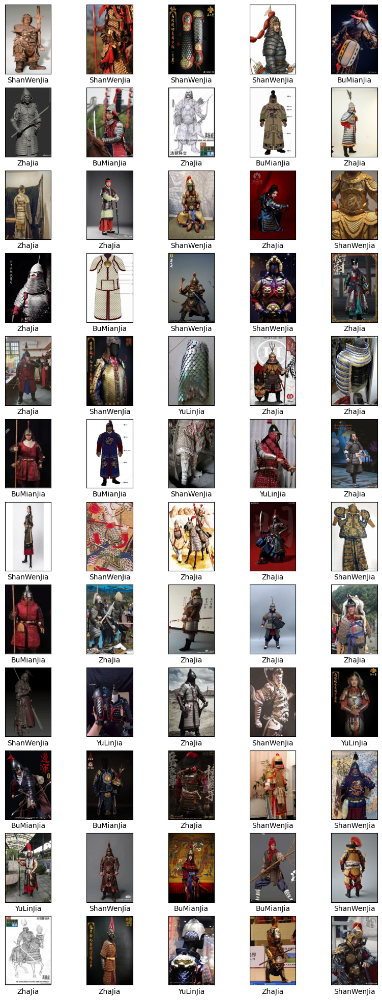

In [56]:

modelPredict1 = buildModel()
modelPredict1.load_weights('best_weights1.h5')



predictions1 = modelPredict1.predict(test_images)
predictResults1 = np.argmax(predictions1, axis=1)

plt.figure(figsize=(10,25))
for i in range(60):
    plt.subplot(12,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    #sample = random.randint(0, 59)
    plt.imshow(test_images[i][:,:,::-1])
    plt.xlabel(class_names[predictResults1[i]])
plt.show()

1/1 [==============================] - 0s 74ms/step


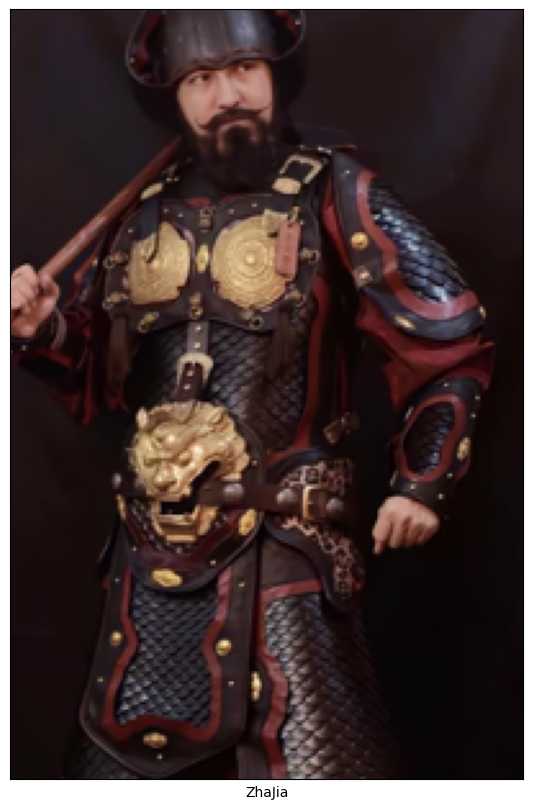

In [61]:
testFolder = './train/testSinglePic/'

testImages1 = []

for filename in os.listdir(testFolder):    
    img_path = os.path.join(testFolder, filename)
    img = cv2.imread(img_path)
    img = img / 255.0
    img = cv2.resize(img, (image_sizex, image_sizey))
    testImages1.append(img)    

testImageArr = np.array(testImages1)
predictions2 = modelPredict1.predict(testImageArr)
predictResults2 = np.argmax(predictions2, axis=1)
plt.figure(figsize=(10,10))

for i in range(len(testImageArr)):
    plt.subplot(len(testImageArr),1,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)    
    plt.imshow(testImageArr[i][:,:,::-1])
    plt.xlabel(class_names[predictResults2[i]])
plt.show()